In [ ]:
import os, math, json, numpy as np, torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm

import torchvision.transforms.functional as TF
from torchvision.transforms import InterpolationMode as IM

# root with your 80-frame .npz files
NPZ_DIR = r"D:/dataset/npz_80"

# fixed split as you requested
all_npz = sorted([f for f in os.listdir(NPZ_DIR) if f.endswith(".npz")])
train_files = all_npz[:210]
val_files   = all_npz[210:255]

len(train_files), len(val_files)


(210, 45)

In [3]:
from typing import Tuple

def letterbox_params(H:int, W:int, target_hw:Tuple[int,int]):
    th, tw = target_hw
    scale = min(th / H, tw / W)
    nh, nw = int(round(H * scale)), int(round(W * scale))
    pad_h = th - nh
    pad_w = tw - nw
    pad_top    = pad_h // 2
    pad_bottom = pad_h - pad_top
    pad_left   = pad_w // 2
    pad_right  = pad_w - pad_left
    return nh, nw, scale, (pad_left, pad_right, pad_top, pad_bottom)

def apply_letterbox(img_t: torch.Tensor, target_hw:Tuple[int,int]):
    """
    img_t: (C,H,W) in [0,1]
    returns (C,th,tw), meta (H,W, nh,nw, scale, pads)
    """
    C, H, W = img_t.shape
    nh, nw, scale, pads = letterbox_params(H, W, target_hw)
    th, tw = target_hw
    img_t = F.interpolate(img_t.unsqueeze(0), size=(nh, nw), mode="bilinear", align_corners=False).squeeze(0)
    pl, pr, pt, pb = pads
    img_t = F.pad(img_t, (pl, pr, pt, pb), value=0.0)
    return img_t, (H, W, nh, nw, scale, pads)

def undo_letterbox(mask_t: torch.Tensor, meta):
    """
    mask_t: (1,th,tw) float/binary after letterbox
    meta from apply_letterbox
    returns (1,H,W) in original size (nearest)
    """
    H, W, nh, nw, scale, (pl, pr, pt, pb) = meta
    # remove padding
    m = mask_t[..., pt:pt+nh, pl:pl+nw]
    # resize back
    m = F.interpolate(m, size=(H, W), mode="nearest")
    return m


In [ ]:
class SegPositiveNPZ2D(Dataset):
    """
    Yields (img, mask, meta) for frames where label in {1,2}.
    - img: (1, th, tw) normalized to [-1,1]
    - mask: (1, th, tw) in {0,1}
    - meta: dict with file, frame_idx, pixel_spacing, original HW, letterbox meta
    """
    def __init__(self, npz_dir, files, target_hw=(288, 352), augment=True):
        self.npz_dir   = npz_dir
        self.files     = files
        self.target_hw = target_hw
        self.augment   = augment
        self.items     = []  # (fname, frame_idx)

        for f in files:
            case = np.load(os.path.join(npz_dir, f), mmap_mode="r")
            labels = case["label"].astype(np.int64)
            pos = np.where((labels==1)|(labels==2))[0]
            for i in pos:
                self.items.append((f, int(i)))

    def __len__(self): return len(self.items)

    def _load_frame(self, case, idx):
        img = case["image"][idx].astype(np.float32)   # (H,W)
        msk = case["mask"][idx].astype(np.uint8)      # (H,W) values {0,1,2}
        # per-frame min-max -> [0,1]
        mn, mx = img.min(), img.max()
        img = (img - mn) / (mx - mn + 1e-8)
        # map {1,2} -> 1
        msk = (msk > 0).astype(np.float32)
        return img, msk

    def __getitem__(self, idx):
        fname, i = self.items[idx]
        case = np.load(os.path.join(self.npz_dir, fname), mmap_mode="r")

        img_np, msk_np = self._load_frame(case, i)
        H, W = img_np.shape

        # to torch
        img_t = torch.from_numpy(img_np)[None, ...]  # (1,H,W)
        msk_t = torch.from_numpy(msk_np)[None, ...]  # (1,H,W)

        # --- paired augmentations (keep modest) ---
        if self.augment:
            # horizontal flip
            if torch.rand(1).item() < 0.5:
                img_t = torch.flip(img_t, dims=[2])
                msk_t = torch.flip(msk_t, dims=[2])
            # small random rotation (-15..15)
            if torch.rand(1).item() < 0.5:
                ang = (torch.rand(1).item() * 30.0) - 15.0
                img_t = TF.rotate(img_t, ang, interpolation=IM.BILINEAR, fill=0.0)
                msk_t = TF.rotate(msk_t, ang, interpolation=IM.NEAREST,  fill=0.0)
            # slight noise
            if torch.rand(1).item() < 0.25:
                img_t = (img_t + 0.03*torch.randn_like(img_t)).clamp(0,1)

        # letterbox to target
        img_t, meta_lb = apply_letterbox(img_t, self.target_hw)   # (1,th,tw)
        msk_t, _       = apply_letterbox(msk_t, self.target_hw)   # (1,th,tw)

        # final normalize to [-1,1]
        img_t = (img_t - 0.5)/0.5

        meta = {
            "file": fname,
            "frame_idx": i,
            "pixel_spacing": float(case["pixel_spacing"]),
            "orig_hw": (H, W),
            "lb_meta": meta_lb,
        }
        return img_t.float(), msk_t.float(), meta


In [5]:
! pip install segmentation-models-pytorch timm

  Using cached charset_normalizer-3.4.3-cp310-cp310-win_amd64.whl.metadata (37 kB)
  Using cached idna-3.10-py3-none-any.whl.metadata (10 kB)
  Using cached urllib3-2.5.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached certifi-2025.8.3-py3-none-any.whl.metadata (2.4 kB)
   ---------------------------------------- 0.0/2.5 MB ? eta -:--:--
   ---------------------------------------- 2.5/2.5 MB 23.8 MB/s eta 0:00:00
   ---------------------------------------- 0.0/561.5 kB ? eta -:--:--
   ---------------------------------------- 561.5/561.5 kB 3.2 MB/s eta 0:00:00
Using cached charset_normalizer-3.4.3-cp310-cp310-win_amd64.whl (107 kB)
Using cached idna-3.10-py3-none-any.whl (70 kB)
Using cached urllib3-2.5.0-py3-none-any.whl (129 kB)
Using cached certifi-2025.8.3-py3-none-any.whl (161 kB)

   ------------ ---------------------------  3/10 [idna]
   ---------------------------- -----------  7/10 [huggingface-hub]
   ---------------------------- -----------  7/10 [huggingface-hub]
   ---

In [ ]:
import segmentation_models_pytorch as smp
import torch.nn as nn

class UNetSeg(nn.Module):
    def __init__(self, encoder="resnet18", encoder_weights="imagenet"):
        super().__init__()
        self.unet = smp.Unet(
            encoder_name=encoder,
            encoder_weights=encoder_weights,
            in_channels=1,   # grayscale input
            classes=1        # binary mask
        )
        
    def forward(self, x):
        return self.unet(x)  # (B,1,H,W) logits


c:\Users\User\anaconda3\envs\torch310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:
class DiceBCELoss(nn.Module):
    def __init__(self, bce_weight=0.5):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.bce_weight = bce_weight
    def forward(self, logits, target):
        bce = self.bce(logits, target)
        p = torch.sigmoid(logits)
        inter = (p*target).sum(dim=(1,2,3))
        denom = p.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3)) + 1e-6
        dice = 1 - (2*inter/denom).mean()
        return self.bce_weight*bce + (1-self.bce_weight)*dice

@torch.no_grad()
def dice_iou_from_logits(logits, target, thr=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs >= thr).float()
    inter = (preds*target).sum(dim=(1,2,3))
    pred_sum = preds.sum(dim=(1,2,3))
    targ_sum = target.sum(dim=(1,2,3))
    union = pred_sum + targ_sum - inter
    dice = (2*inter + eps) / (pred_sum + targ_sum + eps)
    iou  = (inter + eps) / (union + eps)
    return dice.mean().item(), iou.mean().item()

In [8]:
target_hw = (288, 352)  # keep this modest for your GPU
train_ds = SegPositiveNPZ2D(NPZ_DIR, train_files, target_hw=target_hw, augment=True)
val_ds   = SegPositiveNPZ2D(NPZ_DIR, val_files,   target_hw=target_hw, augment=False)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=0, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=0, pin_memory=True)


In [14]:
# pick device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# instantiate your UNet model
model = UNetSeg(encoder="resnet18", encoder_weights="imagenet").to(device)

# define loss
criterion = DiceBCELoss()

# define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# scheduler
from torch.optim.lr_scheduler import ReduceLROnPlateau
scheduler = ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=3)


In [19]:
def train_one_epoch(model, loader, criterion, optimizer, device, amp=True):
    model.train()
    tot_loss = tot_dice = tot_iou = 0.0
    scaler = torch.cuda.amp.GradScaler(enabled=(amp and device.type=="cuda"))
    pbar = tqdm(loader, desc="Train", leave=False)
    for imgs, masks, _ in pbar:
        imgs, masks = imgs.to(device), masks.to(device)
        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(amp and device.type=="cuda")):
            logits = model(imgs)
            loss = criterion(logits, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer); scaler.update()

        dice, iou = dice_iou_from_logits(logits, masks)
        bs = imgs.size(0)
        tot_loss += loss.item()*bs; tot_dice += dice*bs; tot_iou += iou*bs
        pbar.set_postfix(loss=f"{loss.item():.3f}", dice=f"{dice:.3f}", iou=f"{iou:.3f}")
    n = len(loader.dataset)
    return tot_loss/n, tot_dice/n, tot_iou/n

@torch.no_grad()
def evaluate(model, loader, criterion, device, amp=True):
    model.eval()
    tot_loss = tot_dice = tot_iou = 0.0
    pbar = tqdm(loader, desc="Val", leave=False)
    for imgs, masks, _ in pbar:
        imgs, masks = imgs.to(device), masks.to(device)
        with torch.cuda.amp.autocast(enabled=(amp and device.type=="cuda")):
            logits = model(imgs)
            loss   = criterion(logits, masks)
        dice, iou = dice_iou_from_logits(logits, masks)
        bs = imgs.size(0)
        tot_loss += loss.item()*bs; tot_dice += dice*bs; tot_iou += iou*bs
        pbar.set_postfix(loss=f"{loss.item():.3f}", dice=f"{dice:.3f}", iou=f"{iou:.3f}")
    n = len(loader.dataset)
    return tot_loss/n, tot_dice/n, tot_iou/n

In [21]:
@torch.no_grad()
def evaluate(model, loader, criterion, device, amp=True):
    model.eval()
    tot_loss = tot_dice = tot_iou = 0.0
    pbar = tqdm(loader, desc="Val", leave=False)
    for imgs, masks, _ in pbar:
        imgs, masks = imgs.to(device), masks.to(device)
        with torch.cuda.amp.autocast(enabled=(amp and device.type=="cuda")):
            logits = model(imgs)
            loss   = criterion(logits, masks)
        dice, iou = dice_iou_from_logits(logits, masks)
        bs = imgs.size(0)
        tot_loss += loss.item()*bs; tot_dice += dice*bs; tot_iou += iou*bs
        pbar.set_postfix(loss=f"{loss.item():.3f}", dice=f"{dice:.3f}", iou=f"{iou:.3f}")
    n = len(loader.dataset)
    return tot_loss/n, tot_dice/n, tot_iou/n

In [22]:
import os
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau

# --- save paths ---
save_dir  = "D:/acouslic-ai-cse4622/saved_weights"
os.makedirs(save_dir, exist_ok=True)
best_path = os.path.join(save_dir, "best_unet_seg.pth")
last_path = os.path.join(save_dir, "last_unet_seg.pth")

# --- optimizer & scheduler ---
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3)

# --- early stopping settings ---
num_epochs = 30
patience   = 7
bad_epochs = 0
best_loss  = float("inf")

print("Starting training...")
try:
    for epoch in range(1, num_epochs + 1):
        print(f"\nEpoch {epoch}/{num_epochs} | LR: {optimizer.param_groups[0]['lr']:.3e}")

        # ---- train ----
        train_loss, train_dice, train_iou = train_one_epoch(
            model, train_loader, criterion, optimizer, device, amp=True
        )

        # ---- validate ----
        val_loss, val_dice, val_iou = evaluate(
            model, val_loader, criterion, device, amp=True
        )

        print(
            f"Train | loss={train_loss:.4f} | dice={train_dice:.4f} | iou={train_iou:.4f}\n"
            f"Val   | loss={val_loss:.4f}   | dice={val_dice:.4f}   | iou={val_iou:.4f}"
        )

        # ---- scheduler (minimize val loss) ----
        scheduler.step(val_loss)

        # ---- checkpointing & early stopping ----
        if val_loss < best_loss:
            best_loss  = val_loss
            bad_epochs = 0
            torch.save(model.state_dict(), best_path)
            print(f"✅ Saved new best model → {best_path} (Val Loss: {val_loss:.4f})")
        else:
            bad_epochs += 1
            print(f"⚠️ No improvement. Patience {bad_epochs}/{patience}")
            if bad_epochs >= patience:
                print("⏹️ Early stopping triggered.")
                break

finally:
    # always save the last state so you can resume/debug
    torch.save(model.state_dict(), last_path)
    print(f"Model state saved to {last_path}")
    print(f"Best Val Loss: {best_loss:.4f} (checkpoint at {best_path})")


C:\Users\User\AppData\Local\Temp\ipykernel_7036\2924888343.py:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(amp and device.type=="cuda"))


Starting training...

Epoch 1/30 | LR: 1.000e-03


Train:   0%|          | 0/587 [00:00<?, ?it/s]C:\Users\User\AppData\Local\Temp\ipykernel_7036\2924888343.py:9: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(amp and device.type=="cuda")):
Val:   0%|          | 0/119 [00:00<?, ?it/s]                                               C:\Users\User\AppData\Local\Temp\ipykernel_7036\360938910.py:8: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(amp and device.type=="cuda")):


Train | loss=0.1210 | dice=0.8737 | iou=0.7939
Val   | loss=0.0901   | dice=0.8959   | iou=0.8227
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0901)

Epoch 2/30 | LR: 1.000e-03


Train | loss=0.0681 | dice=0.9253 | iou=0.8668
Val   | loss=0.0910   | dice=0.8879   | iou=0.8206
⚠️ No improvement. Patience 1/7

Epoch 3/30 | LR: 1.000e-03


Train | loss=0.0564 | dice=0.9374 | iou=0.8855
Val   | loss=0.0650   | dice=0.9226   | iou=0.8634
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0650)

Epoch 4/30 | LR: 1.000e-03


Train | loss=0.0496 | dice=0.9451 | iou=0.8988
Val   | loss=0.0607   | dice=0.9288   | iou=0.8707
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0607)

Epoch 5/30 | LR: 1.000e-03


Train | loss=0.0488 | dice=0.9458 | iou=0.8996
Val   | loss=0.0628   | dice=0.9263   | iou=0.8681
⚠️ No improvement. Patience 1/7

Epoch 6/30 | LR: 1.000e-03


Train | loss=0.0523 | dice=0.9419 | iou=0.8941
Val   | loss=0.0589   | dice=0.9305   | iou=0.8754
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0589)

Epoch 7/30 | LR: 1.000e-03


Train | loss=0.0448 | dice=0.9500 | iou=0.9065
Val   | loss=0.0891   | dice=0.9060   | iou=0.8417
⚠️ No improvement. Patience 1/7

Epoch 8/30 | LR: 1.000e-03


Train | loss=0.0439 | dice=0.9510 | iou=0.9082
Val   | loss=0.0576   | dice=0.9320   | iou=0.8780
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0576)

Epoch 9/30 | LR: 1.000e-03


Train | loss=0.0404 | dice=0.9548 | iou=0.9144
Val   | loss=0.0575   | dice=0.9336   | iou=0.8788
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0575)

Epoch 10/30 | LR: 1.000e-03


Train | loss=0.0464 | dice=0.9484 | iou=0.9050
Val   | loss=0.0623   | dice=0.9290   | iou=0.8731
⚠️ No improvement. Patience 1/7

Epoch 11/30 | LR: 1.000e-03


Train | loss=0.0401 | dice=0.9553 | iou=0.9161
Val   | loss=0.0751   | dice=0.9207   | iou=0.8583
⚠️ No improvement. Patience 2/7

Epoch 12/30 | LR: 1.000e-03


Train | loss=0.0449 | dice=0.9502 | iou=0.9078
Val   | loss=0.0592   | dice=0.9324   | iou=0.8773
⚠️ No improvement. Patience 3/7

Epoch 13/30 | LR: 1.000e-03


Train | loss=0.0382 | dice=0.9572 | iou=0.9190
Val   | loss=0.0512   | dice=0.9405   | iou=0.8896
✅ Saved new best model → D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth (Val Loss: 0.0512)

Epoch 14/30 | LR: 1.000e-03


Train | loss=0.0348 | dice=0.9609 | iou=0.9253
Val   | loss=0.0559   | dice=0.9365   | iou=0.8843
⚠️ No improvement. Patience 1/7

Epoch 15/30 | LR: 1.000e-03


Train | loss=0.0325 | dice=0.9634 | iou=0.9300
Val   | loss=0.0587   | dice=0.9335   | iou=0.8800
⚠️ No improvement. Patience 2/7

Epoch 16/30 | LR: 1.000e-03


Train | loss=0.0379 | dice=0.9576 | iou=0.9205
Val   | loss=0.0692   | dice=0.9174   | iou=0.8622
⚠️ No improvement. Patience 3/7

Epoch 17/30 | LR: 1.000e-03


Train | loss=0.0371 | dice=0.9585 | iou=0.9219
Val   | loss=0.0563   | dice=0.9355   | iou=0.8825
⚠️ No improvement. Patience 4/7

Epoch 18/30 | LR: 5.000e-04


Train | loss=0.0291 | dice=0.9672 | iou=0.9369
Val   | loss=0.0530   | dice=0.9400   | iou=0.8894
⚠️ No improvement. Patience 5/7

Epoch 19/30 | LR: 5.000e-04


Train | loss=0.0278 | dice=0.9687 | iou=0.9398
Val   | loss=0.0567   | dice=0.9365   | iou=0.8837
⚠️ No improvement. Patience 6/7

Epoch 20/30 | LR: 5.000e-04


Train | loss=0.0259 | dice=0.9707 | iou=0.9435
Val   | loss=0.0559   | dice=0.9374   | iou=0.8854
⚠️ No improvement. Patience 7/7
⏹️ Early stopping triggered.
Model state saved to D:/acouslic-ai-cse4622/saved_weights\last_unet_seg.pth
Best Val Loss: 0.0512 (checkpoint at D:/acouslic-ai-cse4622/saved_weights\best_unet_seg.pth)


In [32]:
! pip install opencv-python

   ---------------------------------------- 0.0/39.0 MB ? eta -:--:--
    --------------------------------------- 0.5/39.0 MB 5.6 MB/s eta 0:00:07
   --- ------------------------------------ 3.4/39.0 MB 18.3 MB/s eta 0:00:02
   ----- ---------------------------------- 5.0/39.0 MB 12.1 MB/s eta 0:00:03
   ----- ---------------------------------- 5.8/39.0 MB 8.8 MB/s eta 0:00:04
   ------ --------------------------------- 6.8/39.0 MB 7.9 MB/s eta 0:00:05
   --------- ------------------------------ 9.2/39.0 MB 9.1 MB/s eta 0:00:04
   ----------- ---------------------------- 11.0/39.0 MB 8.5 MB/s eta 0:00:04
   ------------ --------------------------- 12.3/39.0 MB 8.4 MB/s eta 0:00:04
   -------------- ------------------------- 14.2/39.0 MB 8.5 MB/s eta 0:00:03
   --------------- ------------------------ 15.5/39.0 MB 8.2 MB/s eta 0:00:03
   ----------------- ---------------------- 16.8/39.0 MB 8.0 MB/s eta 0:00:03
   ------------------ --------------------- 18.1/39.0 MB 7.9 MB/s eta 0:00:0

In [33]:
import numpy as np
import cv2

def largest_component(binary: np.ndarray, min_area: int = 0):
    """
    Keep only the largest connected component in a binary mask.
    Returns a clean binary mask of same shape.
    """
    binary = (binary > 0).astype(np.uint8)
    num, labels, stats, _ = cv2.connectedComponentsWithStats(binary, connectivity=8)
    if num <= 1:
        return binary  # nothing to do (background only or single blob)

    # skip label 0 (background); choose max area
    areas = stats[1:, cv2.CC_STAT_AREA]
    max_i = 1 + np.argmax(areas)
    if min_area > 0 and stats[max_i, cv2.CC_STAT_AREA] < min_area:
        return np.zeros_like(binary, dtype=np.uint8)

    out = np.zeros_like(binary, dtype=np.uint8)
    out[labels == max_i] = 1
    return out


def fill_holes_and_smooth(binary: np.ndarray, k_close: int = 5, k_open: int = 3):
    """
    Fill holes & light smoothing using morphology.
    """
    binary = (binary > 0).astype(np.uint8)

    # Fill holes via flood fill from border
    h, w = binary.shape
    ff = binary.copy()
    mask = np.zeros((h+2, w+2), np.uint8)
    cv2.floodFill(ff, mask, seedPoint=(0,0), newVal=255)
    holes = (~ff.astype(bool) & ~binary.astype(bool)).astype(np.uint8)*255
    filled = (binary*255) | holes

    # Morph close then open to smooth edges
    if k_close > 0:
        k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k_close, k_close))
        filled = cv2.morphologyEx(filled, cv2.MORPH_CLOSE, k)
    if k_open > 0:
        k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k_open, k_open))
        filled = cv2.morphologyEx(filled, cv2.MORPH_OPEN, k)

    return (filled > 0).astype(np.uint8)


def fit_best_shape(binary: np.ndarray, mode: str = "ellipse"):
    """
    Replace the mask with a best-fit 'circle' or 'ellipse' for the largest blob.
    - mode: 'circle' or 'ellipse'
    Returns a binary mask.
    """
    b = largest_component(binary)
    if b.max() == 0:
        return b

    # get contour of largest blob
    cnts, _ = cv2.findContours(b.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if len(cnts) == 0:
        return b

    cnt = max(cnts, key=cv2.contourArea)
    H, W = b.shape
    canvas = np.zeros((H, W), dtype=np.uint8)

    if mode == "circle":
        (x, y), radius = cv2.minEnclosingCircle(cnt)
        cv2.circle(canvas, (int(x), int(y)), int(radius), 1, thickness=-1)
    else:  # ellipse (needs >=5 points)
        if len(cnt) >= 5:
            ellipse = cv2.fitEllipse(cnt)
            cv2.ellipse(canvas, ellipse, 1, thickness=-1)
        else:
            # fallback to circle if not enough points
            (x, y), radius = cv2.minEnclosingCircle(cnt)
            cv2.circle(canvas, (int(x), int(y)), int(radius), 1, thickness=-1)

    return canvas.astype(np.uint8)


def postprocess_mask(
    prob_or_bin: np.ndarray,
    threshold: float = 0.5,
    min_area_frac: float = 0.002,
    keep: str = "largest",           # 'largest' or 'largest+smooth'
    shape: str | None = None,        # None, 'circle', 'ellipse'
):
    """
    One-stop postprocess:
      1) binarize (if probs)
      2) keep largest component (optionally smooth/fill)
      3) optionally replace with best-fit circle/ellipse
    """
    m = prob_or_bin
    if m.dtype != np.uint8 and m.dtype != np.bool_:
        m = (m >= threshold).astype(np.uint8)  # assume probs

    H, W = m.shape
    min_area = int(min_area_frac * H * W)

    m = largest_component(m, min_area=min_area)
    if keep == "largest+smooth":
        m = fill_holes_and_smooth(m, k_close=5, k_open=3)

    if shape in ("circle", "ellipse"):
        m = fit_best_shape(m, mode=shape)

    return m.astype(np.uint8)


In [37]:
# =========================
# Inference on test cases
# =========================
import os, numpy as np, torch
import torch.nn.functional as F
from tqdm import tqdm

# --- reuse your paths / model / utils ---
# Assumes you already have:
# - UNetSeg class
# - apply_letterbox(img_t, target_hw) and undo_letterbox(mask_t, meta)
# - dice_iou_from_logits(logits, target)
# - NPZ_DIR defined
# - best model weights at best_path

# 1) Build test file list (last 45 out of 300)
all_npz = sorted([f for f in os.listdir(NPZ_DIR) if f.endswith(".npz")])
test_files = all_npz[255:300]
print(f"Test files: {len(test_files)}")

# 2) Load best model for inference
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNetSeg(encoder="resnet18", encoder_weights=None).to(device)
state = torch.load(best_path, map_location=device)
model.load_state_dict(state)
model.eval()

# 3) Core per-case prediction
@torch.no_grad()
@torch.no_grad()
def predict_case_npz(
    npz_path: str,
    model: torch.nn.Module,
    device: torch.device,
    target_hw=(288, 352),
    batch_size: int = 16,
    threshold: float = 0.5,
    save_probs: bool = False,
    compute_metrics_if_gt: bool = True
):
    """
    Predict masks ONLY for frames with label > 0.
    For other frames, leaves zeros. Metrics (if GT) are on positive frames only.
    """
    with np.load(npz_path, mmap_mode="r") as case:
        imgs = case["image"]                    # (T,H,W)
        labels = case["label"].astype(np.int64) # (T,)
        uuid = case["uuid"] if "uuid" in case.files else os.path.splitext(os.path.basename(npz_path))[0]
        pos_idx = np.where(labels > 0)[0].astype(int)

        has_gt = ("mask" in case.files) and compute_metrics_if_gt
        if has_gt:
            gtm = (case["mask"] > 0).astype(np.float32)  # (T,H,W), binary

    T, H, W = imgs.shape
    # full-size arrays; negatives stay zero
    pred_mask = np.zeros((T, H, W), dtype=np.uint8)
    pred_prob = np.zeros((T, H, W), dtype=np.float32) if save_probs else None

    dices, ious = [], []  # only for positive frames (if GT exists)

    # nothing to do if no positive frames
    if len(pos_idx) == 0:
        return {
            "uuid": str(uuid),
            "pred_mask": pred_mask,
            "pred_prob": pred_prob,
            "best_frame_idx": -1,
            "best_area": 0,
            "mean_dice": None,
            "mean_iou": None,
        }

    # process only positives in batches
    for start in range(0, len(pos_idx), batch_size):
        end = min(start + batch_size, len(pos_idx))
        ids = pos_idx[start:end]

        proc_list, metas = [], []
        for k in ids:
            img_np = imgs[k].astype(np.float32)
            # per-frame min-max
            mn, mx = img_np.min(), img_np.max()
            img_np = (img_np - mn) / (mx - mn + 1e-8)
            img_t = torch.from_numpy(img_np)[None, ...]  # (1,H,W)
            img_t, meta = apply_letterbox(img_t, target_hw)  # (1,th,tw)
            img_t = (img_t - 0.5) / 0.5                    # [-1,1]
            proc_list.append(img_t)
            metas.append(meta)

        batch = torch.stack(proc_list, 0).to(device)      # (B,1,th,tw)
        with torch.cuda.amp.autocast(enabled=(device.type=="cuda")):
            logits = model(batch)                          # (B,1,th,tw)
            probs  = torch.sigmoid(logits)                 # (B,1,th,tw)

        # back to original size & write into the full tensors
        for i, k in enumerate(ids):
            p = probs[i:i+1]                               # (1,1,th,tw)
            p_full = undo_letterbox(p, metas[i])           # (1,1,H,W)
            p_full = p_full.squeeze(0).squeeze(0).cpu().numpy()  # (H,W)

            if save_probs:
                pred_prob[k] = p_full.astype(np.float32)

            m_bin = postprocess_mask(
                p_full,
                threshold=threshold,
                min_area_frac=0.002,        # ~0.2% of image area; tune as needed
                keep="largest+smooth",      # keep only the largest & smooth it
                shape=None           # or 'circle', or None
            )
            pred_mask[k] = m_bin

            # metrics on positives if GT available
            if has_gt:
                g = torch.from_numpy(gtm[k][None, None, ...]).to(device)       # (1,1,H,W)
                pred = torch.from_numpy(m_bin[None, None, ...]).float().to(device)
                inter = (pred*g).sum(dim=(1,2,3))
                ps = pred.sum(dim=(1,2,3)); gs = g.sum(dim=(1,2,3))
                union = ps + gs - inter
                dice = (2*inter + 1e-6)/(ps + gs + 1e-6)
                iou  = (inter + 1e-6)/(union + 1e-6)
                dices.append(dice.item()); ious.append(iou.item())

    # choose "best" frame among positives by predicted area
    areas_pos = pred_mask[pos_idx].reshape(len(pos_idx), -1).sum(axis=1)
    best_pos_rel = int(np.argmax(areas_pos)) if areas_pos.size > 0 else -1
    best_idx = int(pos_idx[best_pos_rel]) if best_pos_rel >= 0 else -1
    best_area = int(areas_pos[best_pos_rel]) if best_pos_rel >= 0 else 0

    return {
        "uuid": str(uuid),
        "pred_mask": pred_mask,
        "pred_prob": pred_prob,
        "best_frame_idx": best_idx,
        "best_area": best_area,
        "mean_dice": float(np.mean(dices)) if len(dices) else None,
        "mean_iou": float(np.mean(ious)) if len(ious) else None,
    }

# 4) Run inference over test set and save outputs
out_dir = "D:/acouslic-ai-cse4622/preds_test_postprocessed"
os.makedirs(out_dir, exist_ok=True)

summary_rows = []
for fname in tqdm(test_files, desc="Inference(Test)"):
    in_path = os.path.join(NPZ_DIR, fname)
    res = predict_case_npz(
        npz_path=in_path,
        model=model,
        device=device,
        target_hw=(288, 352),
        batch_size=16,
        threshold=0.5,
        save_probs=True,                  # set True to also store probability maps (bigger files)
        compute_metrics_if_gt=True         # will compute Dice/IoU only if "mask" exists in test .npz
    )

    # save per-case predictions
    out_path = os.path.join(out_dir, f"{res['uuid']}_pred.npz")
    if res["pred_prob"] is not None:
        np.savez_compressed(out_path,
            uuid=res["uuid"],
            pred_mask=res["pred_mask"],
            pred_prob=res["pred_prob"],
            best_frame_idx=res["best_frame_idx"])
    else:
        np.savez_compressed(out_path,
            uuid=res["uuid"],
            pred_mask=res["pred_mask"],
            best_frame_idx=res["best_frame_idx"])

    summary_rows.append([
        fname,
        res["uuid"],
        res["best_frame_idx"],
        res["best_area"],
        res["mean_dice"],
        res["mean_iou"]
    ])

# 5) Write a small CSV summary
import csv
csv_path = os.path.join(out_dir, "summary_test.csv")
with open(csv_path, "w", newline="") as f:
    w = csv.writer(f)
    w.writerow(["file","uuid","best_frame_idx","best_area","mean_dice(if_gt)","mean_iou(if_gt)"])
    w.writerows(summary_rows)

print(f"\nSaved {len(test_files)} prediction files to: {out_dir}")
print(f"Summary CSV: {csv_path}")


Test files: 45


Inference(Test):   0%|          | 0/45 [00:00<?, ?it/s]C:\Users\User\AppData\Local\Temp\ipykernel_7036\3187168996.py:92: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=="cuda")):
Inference(Test): 100%|██████████| 45/45 [01:00<00:00,  1.35s/it]


Saved 45 prediction files to: D:/acouslic-ai-cse4622/preds_test_postprocessed
Summary CSV: D:/acouslic-ai-cse4622/preds_test_postprocessed\summary_test.csv


In [38]:
import pandas as pd

# load csv
df = pd.read_csv("D:/acouslic-ai-cse4622/preds_test_postprocessed/summary_test.csv")

# summarize
summary = {
    "num_cases": len(df),
    "mean_dice": df["mean_dice(if_gt)"].mean(),
    "std_dice": df["mean_dice(if_gt)"].std(),
    "median_dice": df["mean_dice(if_gt)"].median(),
    "mean_iou": df["mean_iou(if_gt)"].mean(),
    "std_iou": df["mean_iou(if_gt)"].std(),
    "median_iou": df["mean_iou(if_gt)"].median(),
    "mean_best_area": df["best_area"].mean(),
    "std_best_area": df["best_area"].std(),
}

print(pd.DataFrame([summary]))


   num_cases  mean_dice  std_dice  median_dice  mean_iou   std_iou  \
0         45    0.94128  0.018551     0.943649  0.891532  0.031193   

   median_iou  mean_best_area  std_best_area  
0    0.895806    58909.044444   21414.105481  


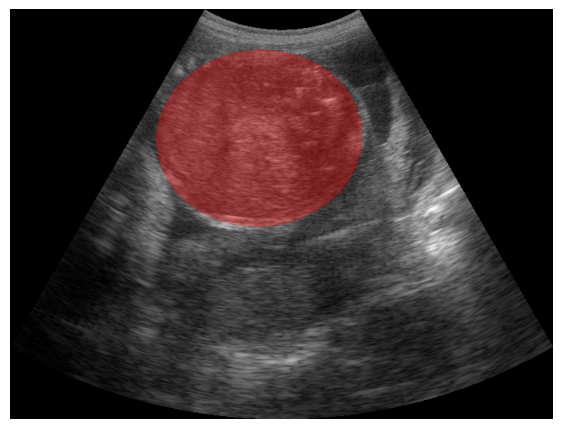

In [35]:
import matplotlib.pyplot as plt

def show_overlay(npz_in, npz_pred, frame_idx):
    with np.load(npz_in, mmap_mode="r") as case:
        img = case["image"][frame_idx].astype(np.float32)
        img = (img - img.min())/(img.max() - img.min() + 1e-8)
    with np.load(npz_pred) as pred:
        m = pred["pred_mask"][frame_idx].astype(np.uint8)

    plt.figure(figsize=(7,6))
    plt.imshow(img, cmap="gray")
    overlay = np.zeros((*m.shape, 4), dtype=np.float32)
    overlay[m==1] = [1,0,0,0.35]  # red overlay
    plt.imshow(overlay)
    plt.axis("off"); plt.show()

# example:
case_name, uuid = summary_rows[0][0], summary_rows[0][1]
in_path  = os.path.join(NPZ_DIR, case_name)
pred_npz = os.path.join(out_dir, f"{uuid}_pred.npz")
best_idx = summary_rows[0][2]
show_overlay(in_path, pred_npz, best_idx)


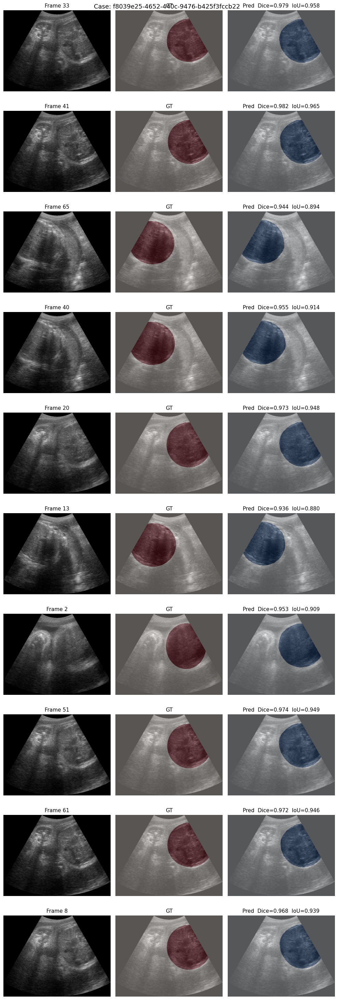

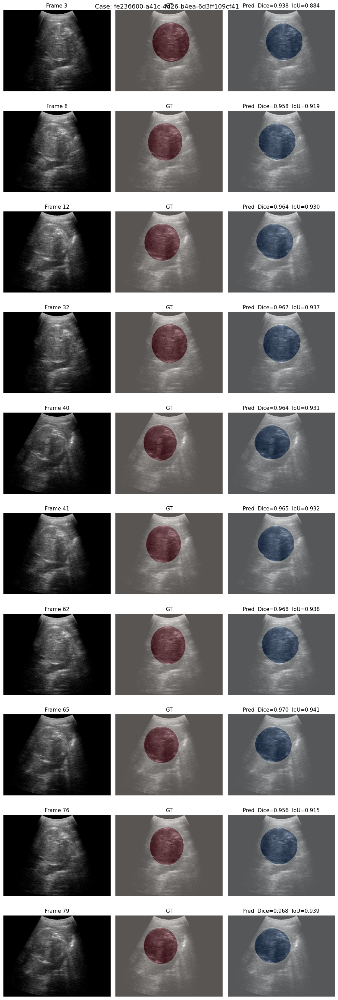

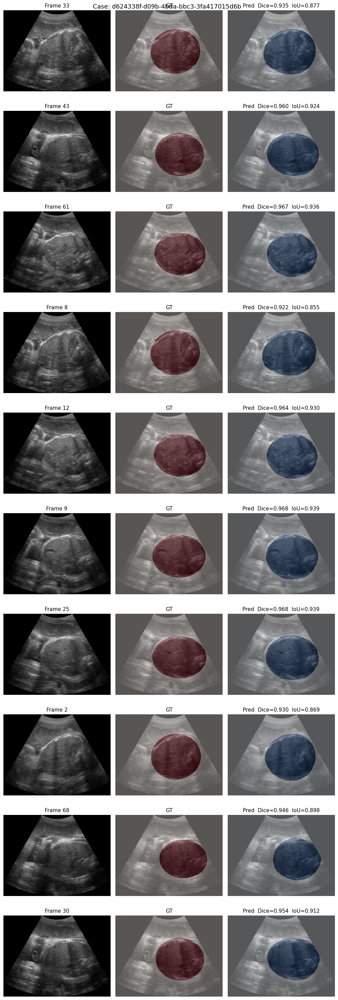

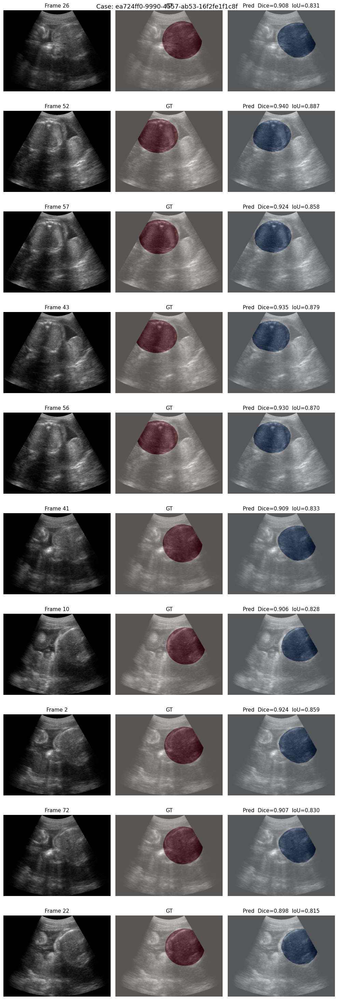

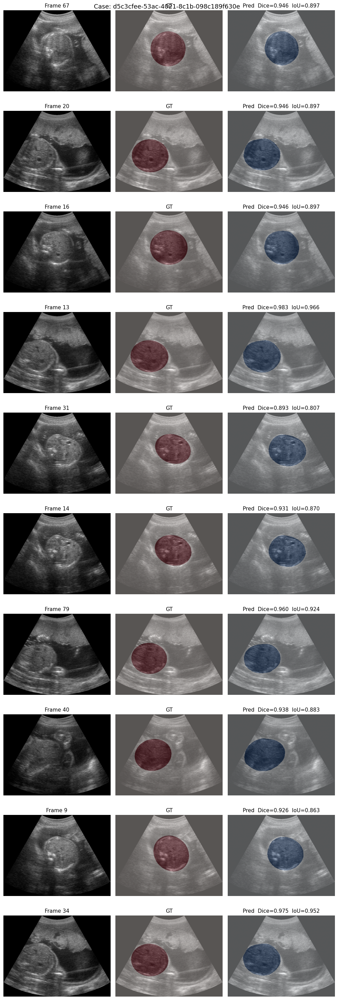

In [39]:
import os, random, numpy as np
import matplotlib.pyplot as plt

def _find_gt_file(npz_dir, uuid):
    """Try exact UUID.npz first; otherwise scan directory for a file starting with the UUID."""
    exact = os.path.join(npz_dir, f"{uuid}.npz")
    if os.path.exists(exact):
        return exact
    # fallback: first file that starts with uuid
    for f in os.listdir(npz_dir):
        if f.endswith(".npz") and f.startswith(str(uuid)):
            return os.path.join(npz_dir, f)
    return None

def _normalize01(x):
    x = x.astype(np.float32)
    mn, mx = x.min(), x.max()
    return (x - mn) / (mx - mn + 1e-8)

def _perframe_dice_iou(pred_bin, gt_bin, eps=1e-6):
    """pred_bin, gt_bin: (H, W) in {0,1}"""
    inter = (pred_bin & gt_bin).sum()
    p = pred_bin.sum()
    g = gt_bin.sum()
    union = p + g - inter
    dice = (2*inter + eps) / (p + g + eps)
    iou  = (inter + eps) / (union + eps)
    return float(dice), float(iou)

def visualize_positive_frames(npz_dir, pred_dir, n_cases=5, n_frames=3, threshold=0.5):
    """
    For n_cases: pick predicted cases, load GT and show only frames with label > 0.
    If none are positive, shows the 'best_frame_idx' (and a couple neighbors if available).
    Each row: [Image, GT overlay, Pred overlay]. Per-frame Dice/IoU printed in titles (if GT available).
    """
    pred_files = [f for f in os.listdir(pred_dir) if f.endswith("_pred.npz")]
    if len(pred_files) == 0:
        print("No prediction files found in:", pred_dir)
        return

    sample_cases = random.sample(pred_files, min(n_cases, len(pred_files)))

    for pfile in sample_cases:
        # load prediction npz
        ppath = os.path.join(pred_dir, pfile)
        with np.load(ppath) as pr:
            uuid      = str(pr["uuid"])
            pred_mask = pr["pred_mask"]            # (T,H,W) uint8
            best_idx  = int(pr["best_frame_idx"])  # may be -1 if none
        # find GT/source
        gpath = _find_gt_file(npz_dir, uuid)
        if gpath is None:
            print(f"[WARN] No GT/source NPZ found for uuid={uuid}. Skipping.")
            continue

        with np.load(gpath, mmap_mode="r") as gt:
            imgs   = gt["image"]                 # (T,H,W)
            labels = gt["label"].astype(int)     # (T,)
            has_gt_mask = "mask" in gt.files
            if has_gt_mask:
                gt_mask = (gt["mask"] > 0).astype(np.uint8)  # (T,H,W) binary
            else:
                gt_mask = None

        T = imgs.shape[0]
        pos_idx = np.where(labels > 0)[0].tolist()

        # choose frame indices to visualize
        if len(pos_idx) == 0:
            # fallback: use best frame and neighbors
            if best_idx >= 0:
                cand = [best_idx]
                if best_idx - 1 >= 0: cand.append(best_idx - 1)
                if best_idx + 1 < T: cand.append(best_idx + 1)
                frame_ids = cand[:n_frames]
            else:
                frame_ids = random.sample(range(T), min(n_frames, T))
            note = "(no positive labels; fallback)"
        else:
            # sample positives
            if len(pos_idx) > n_frames:
                frame_ids = random.sample(pos_idx, n_frames)
            else:
                frame_ids = pos_idx
            note = ""

        # build figure
        rows = len(frame_ids)
        fig, axs = plt.subplots(rows, 3, figsize=(10, 3*rows))
        if rows == 1:
            axs = np.array([axs])  # make 2D for uniform indexing

        fig.suptitle(f"Case: {uuid}  {note}", fontsize=13)
        for r, idx in enumerate(frame_ids):
            img = _normalize01(imgs[idx])
            pred = pred_mask[idx].astype(np.uint8)
            ax0, ax1, ax2 = axs[r, 0], axs[r, 1], axs[r, 2]

            # image
            ax0.imshow(img, cmap="gray")
            ax0.set_title(f"Frame {idx}", fontsize=11)
            ax0.axis("off")

            # GT overlay (if available)
            if gt_mask is not None:
                ax1.imshow(img, cmap="gray")
                ax1.imshow(gt_mask[idx], cmap="Reds", alpha=0.35)
                ax1.set_title("GT", fontsize=11)
                ax1.axis("off")
            else:
                ax1.axis("off")
                ax1.set_title("GT (N/A)", fontsize=11)

            # Pred overlay
            ax2.imshow(img, cmap="gray")
            ax2.imshow(pred, cmap="Blues", alpha=0.35)
            # per-frame metrics if GT exists
            if gt_mask is not None:
                d, j = _perframe_dice_iou(pred.astype(bool), gt_mask[idx].astype(bool))
                ax2.set_title(f"Pred  Dice={d:.3f}  IoU={j:.3f}", fontsize=11)
            else:
                ax2.set_title("Pred", fontsize=11)
            ax2.axis("off")

        plt.tight_layout()
        plt.show()

# ---- run it ----
NPZ_DIR  = "D:/dataset/npz_80"                     # GT/source NPZs
PRED_DIR = "D:/acouslic-ai-cse4622/preds_test_postprocessed"     # your saved predictions
visualize_positive_frames(NPZ_DIR, PRED_DIR, n_cases=5, n_frames=10, threshold=0.5)
